In [40]:
%matplotlib inline
import os
import copy
import grid2op
import numpy as np
import pandas as pd
from cycler import cycler
from matplotlib import cm
import matplotlib.pyplot as plt
from grid2op.Episode import EpisodeData
from grid2op.PlotGrid import PlotMatplot

In [3]:
the_fontsize = 8

def _get_all_values(observations, str_function):
    ans = []
    for i in range(1,len(observations)):
        ans.append(getattr(observations[i], str_function))
    return np.array(ans)

def _get_all_action_values(actions, action_key, n_gen=None):
    ans = []
    for i in range(len(actions)):
        act = actions[i].as_dict()
        try:
            spec_act = act[action_key]
        except KeyError:
            spec_act = [0 for i in range(n_gen)]
            
        ans.append(spec_act)
    return np.array(ans)

Read chronics

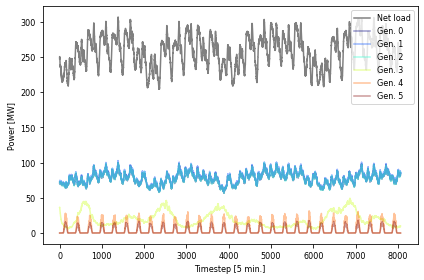

In [3]:
path = 'C:\\Users\\Felipe\\data_grid2op\\l2rpn_case14_sandbox\\chronics\\0000'
load = os.path.join(path, 'load_p.csv.bz2')
gen = os.path.join(path, 'prod_p.csv.bz2')
ld = pd.read_csv(load, sep=';')
gn = pd.read_csv(gen, sep=';')
gn.columns = ['Gen. {}'.format(i) for i in range(6)]
fig, ax = plt.subplots(1)
ld.sum(axis=1).plot(ax=ax, label='Net load', color='gray')
gn.plot(ax=ax, alpha=0.4, cmap=cm.jet)
ax.set_xlabel('Timestep [5 min.]', fontsize=the_fontsize)
ax.set_ylabel('Power [MW]', fontsize=the_fontsize)
ax.legend(fontsize=the_fontsize, loc=1)
plt.xticks(fontsize=the_fontsize)
plt.yticks(fontsize=the_fontsize)
fig.show()
fig.tight_layout()
#fig.savefig(os.path.join(path,'thefig'), dpi=560)
#plt.close(fig)

# From EpisodeData

In [90]:
#case = "_AGC_sandbox_DoNothing_Di24Reward_(AC_pqp)"
#case = "_AGC_sandbox_ExpertSystem_Di24Reward_(AC_ExpSys_ovf.95)"
#case = "_AGC_sandbox_D3QN_CDi242Reward_(AC_acdi_ovfMax_to50)_BEST"
case = "_AGC_sandbox_D3QN_CDi242Reward_(AC_pow5050)_BEST2_DUSTUF"
episode_studied = "0011"
path_save = 'D:\\ESDA_MSc\\Dissertation\\code_stuff\\cases\\dissertation_singles_and_D3QN_sensitivity\\{}'.format(case)
this_episode = EpisodeData.from_disk(path_save, episode_studied)
plays = this_episode.meta['nb_timestep_played']
x = np.arange(plays)
obs = copy.deepcopy(this_episode.observations)
acts = copy.deepcopy(this_episode.actions)
disp_available = obs[-1].gen_redispatchable
disp = np.arange(obs[-1].n_gen)[disp_available]

Grid Layout

In [ ]:
plot_helper = PlotMatplot(observation_space=this_episode.observation_space, width=1280, height=800)
plot_helper._line_bus_radius = 7
#fig = plot_helper.plot_obs(obs)
fig = plot_helper.plot_layout()
plt.show()

Actual dispatch vs operator dispatch

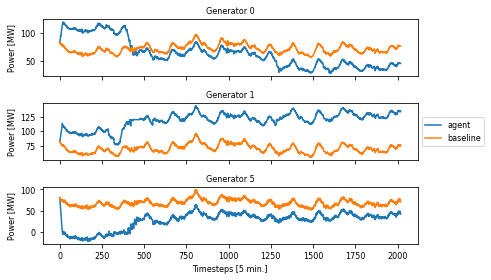

In [91]:
ac_disp = _get_all_values(obs, 'actual_dispatch')
prod_p = _get_all_values(obs, 'prod_p')
ac_disp = ac_disp
prod_p = prod_p
pre_prod_p = prod_p - ac_disp

fig, ax = plt.subplots(3, sharex=True) # 3 dispatchable generators
for ix, d in enumerate(disp):
    ax[ix].set_title('Generator {}'.format(d), fontsize=the_fontsize)
    ax[ix].plot(x, prod_p[:,d], label='agent')
    ax[ix].plot(x, pre_prod_p[:,d], label='baseline')
    ax[ix].set_ylabel('Power [MW]', fontsize=the_fontsize)
    ax[ix].tick_params(axis='x', labelsize=the_fontsize)
    ax[ix].tick_params(axis='y', labelsize=the_fontsize)
box = ax[1].get_position()
ax[1].set_position([box.x0, box.y0, box.width*0.65, box.height])
legend_x = 1
legend_y = 0.5
ax[1].legend(loc='center left', bbox_to_anchor=(legend_x, legend_y), fontsize=the_fontsize)
ax[ix].set_xlabel('Timesteps [5 min.]', fontsize=the_fontsize)
fig.tight_layout()

Overall flow

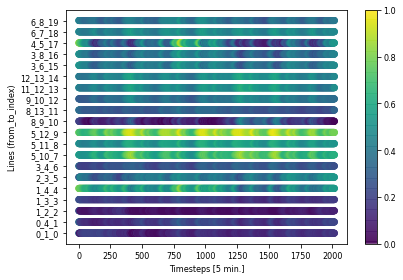

In [92]:
fig, a0 = plt.subplots(1)

#a0.set_title('Relative flow', fontsize=the_fontsize)
a0.set_ylabel('Lines (from_to_index)', fontsize=the_fontsize)
a0.set_xlabel('Timesteps [5 min.]', fontsize=the_fontsize)

rho = _get_all_values(obs, 'rho')
for lix in range(rho.shape[1]):
    im = a0.scatter(x, ['{}'.format(obs[-1].name_line[lix])]*plays, c=rho[:,lix], vmin=0, vmax=1, alpha=0.7)
cbar = fig.colorbar(im, ax=a0)
cbar.ax.tick_params(labelsize=the_fontsize)
a0.tick_params(axis='x', labelsize=the_fontsize)
a0.tick_params(axis='y', labelsize=the_fontsize)

fig.tight_layout()
fig.savefig(os.path.join(path_save, 'flow_heatmap'), dpi=560)
plt.show()

Action analysis graphs

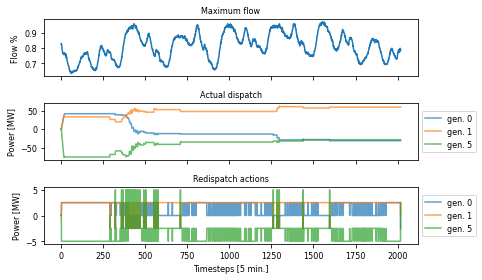

In [93]:
fig, (a0, a1, a2) = plt.subplots(3, sharex=True)
#colors = cm.hsv(np.linspace(0,1,3))

a0.set_title('Maximum flow', fontsize=the_fontsize)
a0.set_ylabel('Flow %', fontsize=the_fontsize)

a1.set_title('Actual dispatch', fontsize=the_fontsize)
a1.set_ylabel('Power [MW]', fontsize=the_fontsize)

a2.set_title('Redispatch actions', fontsize=the_fontsize)
a2.set_ylabel('Power [MW]', fontsize=the_fontsize)
a2.set_xlabel('Timesteps [5 min.]', fontsize=the_fontsize)

#a0.plot(x, np.sum(rho, axis=1)/obs[-1].n_line)
a0.plot(x, np.max(rho, axis=1))
a0.tick_params(axis='x', labelsize=the_fontsize)
a0.tick_params(axis='y', labelsize=the_fontsize)

ac_disp = _get_all_values(obs, 'actual_dispatch')
#a1.set_prop_cycle(cycler('color', colors))
a1.plot(x, ac_disp[:,disp_available], alpha=0.7)
a1.tick_params(axis='x', labelsize=the_fontsize)
a1.tick_params(axis='y', labelsize=the_fontsize)
box = a1.get_position()
a1.set_position([box.x0, box.y0, box.width*0.65, box.height])
legend_x = 1
legend_y = 0.5
a1.legend(['gen. {}'.format(i) for i in disp], loc='center left', bbox_to_anchor=(legend_x, legend_y), fontsize=the_fontsize)

redisp_act = _get_all_action_values(acts, 'redispatch', n_gen=obs[-1].n_gen)
#a2.set_prop_cycle(cycler('color', colors))
a2.plot(x, redisp_act[:,disp_available], alpha=0.7)
a2.tick_params(axis='x', labelsize=the_fontsize)
a2.tick_params(axis='y', labelsize=the_fontsize)
box = a2.get_position()
a2.set_position([box.x0, box.y0, box.width*0.65, box.height])
legend_x = 1
legend_y = 0.5
a2.legend(['gen. {}'.format(i) for i in disp], loc='center left', bbox_to_anchor=(legend_x, legend_y), fontsize=the_fontsize)
fig.tight_layout()
plt.show()

# Training or what see DQN as rewards

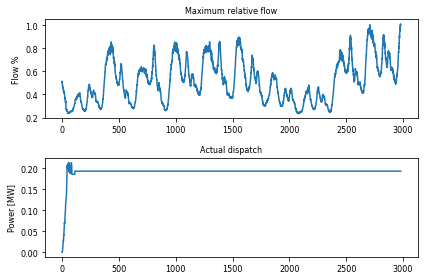

In [8]:
fig, (a0, a1) = plt.subplots(2)

a0.set_title('Maximum relative flow', fontsize=the_fontsize)
a0.set_ylabel('Flow %', fontsize=the_fontsize)

a1.set_title('Actual dispatch', fontsize=the_fontsize)
a1.set_ylabel('Power [MW]', fontsize=the_fontsize)

#a0.plot(x, np.sum(rho, axis=1)/obs[-1].n_line)
a0.plot(x, 50**np.max(rho, axis=1)/50)
a0.tick_params(axis='x', labelsize=the_fontsize)
a0.tick_params(axis='y', labelsize=the_fontsize)

ac_disp = _get_all_values(obs, 'actual_dispatch')
acc_disp = np.abs(ac_disp / obs[-1].gen_pmax)
a1.plot(x, np.sum(acc_disp**2, axis=1)/len(disp))
a1.tick_params(axis='x', labelsize=the_fontsize)
a1.tick_params(axis='y', labelsize=the_fontsize)

fig.tight_layout()
plt.show()

In [94]:
tpath = os.path.join(path_save, 'tf_logs_DDDQN')
loss = pd.read_csv(os.path.join(tpath,'loss.csv'), index_col=0)
qvals = pd.read_csv(os.path.join(tpath,'qvalues.csv'), index_col=0)
reward = pd.read_csv(os.path.join(tpath,'rewards.csv'), index_col=0)
qactions = pd.read_csv(os.path.join(tpath,'qactions.csv'), index_col=0)
qactions['index'] = qactions.index

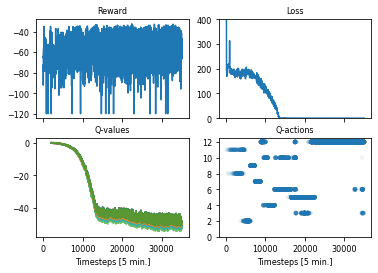

In [97]:
fig, axs = plt.subplots(2,2, sharex=True)
axs[0,0].set_title('Reward', fontsize=the_fontsize)
axs[0,1].set_title('Loss', fontsize=the_fontsize)
axs[1,0].set_title('Q-values', fontsize=the_fontsize)
axs[1,0].set_xlabel('Timesteps [5 min.]', fontsize=the_fontsize)
axs[1,1].set_title('Q-actions', fontsize=the_fontsize)
reward.plot(ax=axs[0,0], legend=None)
loss.plot(ax=axs[0,1], legend=None)
qvals.plot(ax=axs[1,0], legend=None, alpha=0.7)
qactions.plot(kind='scatter', x='index', y='action', alpha=0.07, edgecolors='none', ax=axs[1,1])
axs[0,1].set_ylim(0,400)
axs[1,1].set_ylabel('')
axs[1,1].set_xlabel('Timesteps [5 min.]', fontsize=the_fontsize)
axs[1,1].set_yticks([0,2,4,6,8,10,12])
for i in [0,1]:
    for j in [0,1]:
        axs[i,j].tick_params(axis='x', labelsize=the_fontsize)
        axs[i,j].tick_params(axis='y', labelsize=the_fontsize)
fig.show()